# GAN (generative adversarial network)

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as func

import torchvision as vision
import torchvision.transforms as transforms

import matplotlib.pyplot as plt

from tqdm import tqdm_notebook as tqdm

from sklearn.manifold import TSNE

from torch.autograd import Variable

import numpy as np

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

import gdown
import os

url = 'https://drive.google.com/uc?id=1cNIac61PSA_LqDFYFUeyaQYekYPc75NH'
data_root = '/content/gdrive/My Drive/Colab Notebooks/celeba'
data_folder = '/content/gdrive/My Drive/Colab Notebooks/celeba/img_align_celeba'
download_path = f'{data_root}/celeba.zip'
if not os.path.exists(data_root):
    os.makedirs(data_root)
    os.makedirs(data_folder)

#gdown.download(url, download_path, quiet=False)

import zipfile

#with zipfile.ZipFile(download_path, 'r') as ziphandler:
#    ziphandler.extractall(data_folder)

Mounted at /content/gdrive


Downloading...
From: https://drive.google.com/uc?id=1cNIac61PSA_LqDFYFUeyaQYekYPc75NH
To: /content/gdrive/My Drive/Colab Notebooks/celeba/celeba.zip
1.44GB [00:20, 71.1MB/s]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


202599


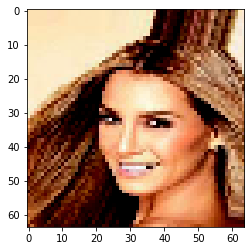

In [15]:
import os
from PIL import Image
from natsort import natsorted

img_size = 64
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Resize((img_size, img_size)),
     transforms.CenterCrop(img_size),
     transforms.Normalize((0.2), (0.8))
    ])

class CoolCelebaDataset(torch.utils.data.Dataset):
    def __init__(self):
        root_dir = f'{data_folder}/img_align_celeba'
        image_names = os.listdir(root_dir)
        self.root_dir = root_dir
        self.transform = transform
        self.image_names = natsorted(image_names)
    
    def __getitem__(self, idx):
        img_path = os.path.join(self.root_dir, self.image_names[idx])
        img = Image.open(img_path).convert('RGB')  
        img = self.transform(img)
        return img
    
    def __len__(self):
        return len(self.image_names)
        
cool_celeba_dataset = CoolCelebaDataset()
print(len(cool_celeba_dataset))
plt.imshow(cool_celeba_dataset[0].permute(1, 2, 0))

In [16]:
class Discriminator(nn.Module):
    def __init__(self, channels_img, features_d):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            # N * channels_img * 64 * 64
            nn.Conv2d(in_channels=channels_img,
                               out_channels=features_d,
                               kernel_size=4, 
                               stride=2,
                               padding=1),
            nn.LeakyReLU(0.2),
            # N * features_d * 32 * 32
            nn.Conv2d(in_channels=features_d,
                      out_channels=features_d * 2,
                      kernel_size=4,
                      stride=2,
                      padding=1),
            nn.BatchNorm2d(features_d * 2),
            nn.LeakyReLU(0.2),
            # N * (features_d * 2) * 16 * 16
            nn.Conv2d(in_channels=features_d * 2,
                      out_channels=features_d * 4,
                      kernel_size=4,
                      stride=2,
                      padding=1),
            nn.BatchNorm2d(features_d * 4),
            nn.LeakyReLU(0.2),
            # N * (features_d * 4) * 8 * 8
            nn.Conv2d(in_channels=features_d * 4,
                      out_channels=features_d * 8,
                      kernel_size=4,
                      stride=2,
                      padding=1),
            nn.BatchNorm2d(features_d * 8),
            nn.LeakyReLU(0.2),
            # N * (features_d * 8) * 4 * 4
            nn.Conv2d(in_channels=features_d * 8,
                      out_channels=1,
                      kernel_size=4,
                      stride=2,
                      padding=0),       
            # N * 1 * 1 * 1
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.net(input)

In [17]:
class Generator(nn.Module):
    def __init__(self, channels_noise, channels_img, featured_g):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            # N * channels_noise * 1 * 1
            nn.ConvTranspose2d(in_channels=channels_noise,
                               out_channels=featured_g * 8,
                               kernel_size=4, 
                               stride=1,
                               padding=0),
            nn.BatchNorm2d(featured_g * 8),
            nn.ReLU(),
            # N * (featured_g * 16) * 4 * 4
            nn.ConvTranspose2d(in_channels=featured_g * 8,
                               out_channels=featured_g * 4,
                               kernel_size=4, 
                               stride=2,
                               padding=1),
            nn.BatchNorm2d(featured_g * 4),
            nn.ReLU(),
            # N * (featured_g * 8) * 8 * 8
            nn.ConvTranspose2d(in_channels=featured_g * 4,
                               out_channels=featured_g * 2,
                               kernel_size=4, 
                               stride=2,
                               padding=1),
            nn.BatchNorm2d(featured_g * 2),
            nn.ReLU(),
            # N * (featured_g * 4) * 16 * 16
            nn.ConvTranspose2d(in_channels=featured_g * 2,
                               out_channels=featured_g,
                               kernel_size=4, 
                               stride=2,
                               padding=1),
            nn.BatchNorm2d(featured_g),
            nn.ReLU(),
            # N * (featured_g * 2) * 32 * 32
            nn.ConvTranspose2d(in_channels=featured_g,
                               out_channels=channels_img,
                               kernel_size=4, 
                               stride=2,
                               padding=1),
            nn.Tanh()
            # N * channels_img  * 64 * 64
        )

    def forward(self, input):
        return self.net(input)

In [18]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        torch.nn.init.normal_(m.weight, 1.0, 0.02)
        torch.nn.init.zeros_(m.bias)

In [19]:
import torchvision.utils as vutils

lr = 0.0002
batch_size = 1000
image_size = 64
channels_img = 3
channels_noise = 100
num_epochs = 20

features_d = 64
features_g = 64

dataloader = torch.utils.data.DataLoader(cool_celeba_dataset, 
                                         batch_size=batch_size, shuffle=True)

netD = Discriminator(channels_img, features_d).to(device)
netD.apply(weights_init)
netG = Generator(channels_noise, channels_img, features_g).to(device)
netG.apply(weights_init)

optimizerD =  torch.optim.Adam(netD.parameters(), lr=lr, betas=(0.5, 0.999))
optimizerG =  torch.optim.Adam(netG.parameters(), lr=lr, betas=(0.5, 0.999))

criterion = nn.BCELoss()

real_label = 1
fake_label = 0

fixed_noise = torch.randn(64, channels_noise, 1, 1).to(device)

img_list = []

# Training Loop
print("Starting Training Loop...")
for epoch in range(num_epochs):
    for i, data in enumerate(tqdm(dataloader, desc=f'epoch {epoch}')):
        data = data.to(device)
        batch_size = data.shape[0]

        ############################
        # (1) Train Discriminator: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        netD.zero_grad()
        label = torch.full((batch_size,), real_label,
                           dtype=data.dtype, device=device)
        output = netD(data).reshape(-1)
        lossD_real = criterion(output, label)
        lossD_real.backward()
        D_x = output.mean().item()

        noise = torch.randn(batch_size, channels_noise, 1, 1).to(device)
        fake = netG(noise)
        label.fill_(fake_label)

        output = netD(fake.detach()).reshape(-1)
        lossD_fake = criterion(output, label)
        lossD_fake.backward()

        lossD = lossD_real + lossD_fake
        optimizerD.step()

        ############################
        # (2) Train Generator: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)
        output = netD(fake).reshape(-1)
        lossG = criterion(output, label)
        lossG.backward()
        optimizerG.step()

        # Output training stats
        if i != 0 and i % 100 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f'
                  % (epoch + 1, num_epochs, i, len(dataloader),
                     lossD, lossG, D_x))
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

Starting Training Loop...


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:36: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


[1/20][100/203]	Loss_D: 0.7029	Loss_G: 4.4777	D(x): 0.7846
[1/20][200/203]	Loss_D: 0.7112	Loss_G: 2.7277	D(x): 0.6816



[2/20][100/203]	Loss_D: 0.9671	Loss_G: 3.7588	D(x): 0.7506
[2/20][200/203]	Loss_D: 1.1931	Loss_G: 3.8175	D(x): 0.7750



[3/20][100/203]	Loss_D: 1.3279	Loss_G: 4.1356	D(x): 0.8641
[3/20][200/203]	Loss_D: 0.8730	Loss_G: 1.9709	D(x): 0.6427



[4/20][100/203]	Loss_D: 1.2390	Loss_G: 3.2490	D(x): 0.8606
[4/20][200/203]	Loss_D: 1.0521	Loss_G: 1.5101	D(x): 0.4806



[5/20][100/203]	Loss_D: 0.7204	Loss_G: 2.2498	D(x): 0.6825
[5/20][200/203]	Loss_D: 0.7654	Loss_G: 1.9089	D(x): 0.6546



[6/20][100/203]	Loss_D: 0.7326	Loss_G: 1.9051	D(x): 0.6554
[6/20][200/203]	Loss_D: 0.8145	Loss_G: 2.3370	D(x): 0.7443



[7/20][100/203]	Loss_D: 0.8115	Loss_G: 3.2690	D(x): 0.8103
[7/20][200/203]	Loss_D: 0.8128	Loss_G: 1.6821	D(x): 0.6473



[8/20][100/203]	Loss_D: 0.6481	Loss_G: 1.8201	D(x): 0.7278
[8/20][200/203]	Loss_D: 0.6789	Loss_G: 2.8350	D(x): 0.8037



[9/20][100/203]	Loss_D: 2.4841	Loss_G: 1.7579	D(x): 0.1315
[9/20][200/203]	Loss_D: 0.7375	Loss_G: 2.4630	D(x): 0.7221



[10/20][100/203]	Loss_D: 0.7606	Loss_G: 1.8265	D(x): 0.6754
[10/20][200/203]	Loss_D: 0.7959	Loss_G: 1.6562	D(x): 0.5575



[11/20][100/203]	Loss_D: 1.0328	Loss_G: 1.4684	D(x): 0.4668
[11/20][200/203]	Loss_D: 0.8490	Loss_G: 2.1236	D(x): 0.6812



[12/20][100/203]	Loss_D: 1.1386	Loss_G: 3.3344	D(x): 0.8666
[12/20][200/203]	Loss_D: 0.8810	Loss_G: 2.6451	D(x): 0.7944



[13/20][100/203]	Loss_D: 0.8907	Loss_G: 3.0176	D(x): 0.8195
[13/20][200/203]	Loss_D: 0.9437	Loss_G: 3.2692	D(x): 0.7751



[14/20][100/203]	Loss_D: 0.7671	Loss_G: 3.1253	D(x): 0.8141
[14/20][200/203]	Loss_D: 1.0944	Loss_G: 3.0017	D(x): 0.8332



[15/20][100/203]	Loss_D: 0.9426	Loss_G: 2.0717	D(x): 0.8341
[15/20][200/203]	Loss_D: 0.8167	Loss_G: 1.7738	D(x): 0.6158



[16/20][100/203]	Loss_D: 0.6747	Loss_G: 1.8699	D(x): 0.6722
[16/20][200/203]	Loss_D: 1.1771	Loss_G: 0.7387	D(x): 0.3753



[17/20][100/203]	Loss_D: 1.6116	Loss_G: 4.4314	D(x): 0.9239
[17/20][200/203]	Loss_D: 0.8516	Loss_G: 2.5829	D(x): 0.7709



[18/20][100/203]	Loss_D: 0.8962	Loss_G: 3.5095	D(x): 0.8375
[18/20][200/203]	Loss_D: 0.7400	Loss_G: 1.8240	D(x): 0.7618



[19/20][100/203]	Loss_D: 1.0913	Loss_G: 2.9306	D(x): 0.8859
[19/20][200/203]	Loss_D: 1.0087	Loss_G: 0.8696	D(x): 0.4544



[20/20][100/203]	Loss_D: 0.8639	Loss_G: 1.8785	D(x): 0.6904
[20/20][200/203]	Loss_D: 0.9742	Loss_G: 1.2599	D(x): 0.5557



Animation size has reached 10724043 bytes, exceeding the limit of 10485760.0. If you're sure you want a larger animation embedded, set the animation.embed_limit rc parameter to a larger value (in MB). This and further frames will be dropped.


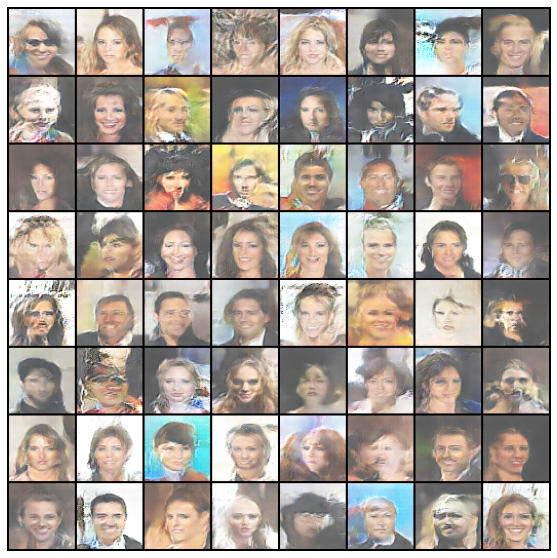

In [30]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import matplotlib

fig = plt.figure(figsize=(10,10))
plt.axis("off")
matplotlib.rcParams['animation.embed_limit'] = 2*5
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())